# import libraries

In [80]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data , morphology , filters , color , feature , exposure ,segmentation
import skimage.io as io
from skimage.util import img_as_ubyte
from skimage.transform import resize
from PIL import Image
from scipy.ndimage import gaussian_filter , generic_filter
from scipy import stats
from sklearn.cluster import KMeans
from scipy.signal import convolve2d

### Digit image

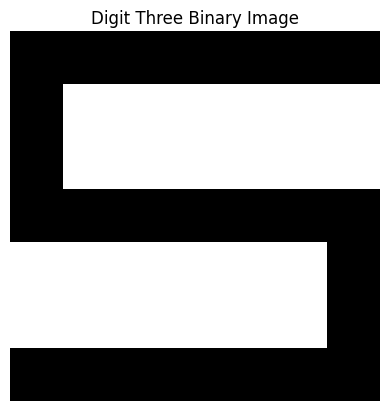

In [2]:
three_binary_img = np.array([
    [1, 1, 1, 1, 1, 1, 1],
    [1, 0, 0, 0, 0, 0, 0],
    [1, 0, 0, 0, 0, 0, 0],
    [1, 1, 1, 1, 1, 1, 1],
    [0, 0, 0, 0, 0, 0, 1],
    [0, 0, 0, 0, 0, 0, 1],
    [1, 1, 1, 1, 1, 1, 1]], dtype=bool)
    
plt.imshow(three_binary_img, cmap='binary')
plt.axis('off')  
plt.title('Digit Three Binary Image') 
plt.show()

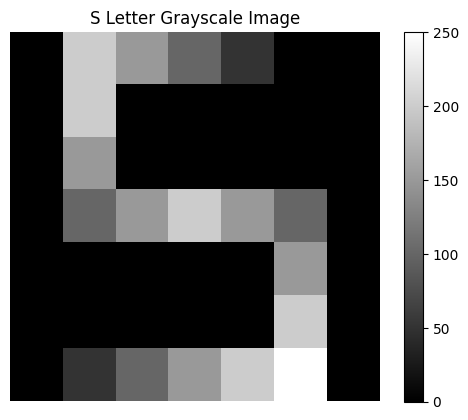

In [3]:
three_gray_img = np.array([
    [0,  200, 150, 100, 50,  0,   0], 
    [0,  200, 0,   0,   0,   0,   0], 
    [0,  150, 0,   0,   0,   0,   0], 
    [0,  100, 150, 200, 150, 100, 0],
    [0,  0,   0,   0,   0,   150, 0], 
    [0,  0,   0,   0,   0,   200, 0], 
    [0,  50,  100, 150, 200, 250, 0] 
], dtype=np.uint8)
    
plt.imshow(three_gray_img, cmap='gray')
plt.axis('off')  
plt.title('S Letter Grayscale Image') 
plt.colorbar()
plt.show()

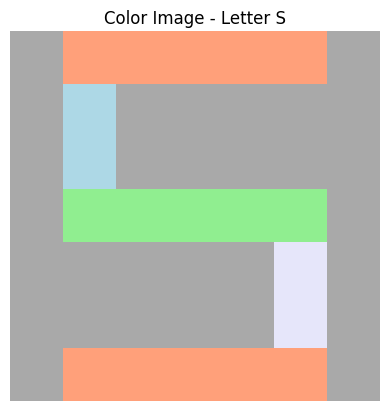

In [4]:
s_color_img = np.array([
    
    [[169, 169, 169], [255, 160, 122], [255, 160, 122], [255, 160, 122], [255, 160, 122], [255, 160, 122], [169, 169, 169]],

    [[169, 169, 169], [173, 216, 230], [169, 169, 169], [169, 169, 169], [169, 169, 169], [169, 169, 169], [169, 169, 169]],

    [[169, 169, 169], [173, 216, 230], [169, 169, 169], [169, 169, 169], [169, 169, 169], [169, 169, 169], [169, 169, 169]],
 
    [[169, 169, 169], [144, 238, 144], [144, 238, 144], [144, 238, 144], [144, 238, 144], [144, 238, 144], [169, 169, 169]],

    [[169, 169, 169], [169, 169, 169], [169, 169, 169], [169, 169, 169], [169, 169, 169], [230, 230, 250], [169, 169, 169]],

    [[169, 169, 169], [169, 169, 169], [169, 169, 169], [169, 169, 169], [169, 169, 169], [230, 230, 250], [169, 169, 169]],
 
    [[169, 169, 169], [255, 160, 122], [255, 160, 122], [255, 160, 122], [255, 160, 122], [255, 160, 122], [169, 169, 169]]
], dtype=np.uint8)

plt.imshow(s_color_img)
plt.title('Color Image - Letter S')
plt.axis('off') 
plt.show()

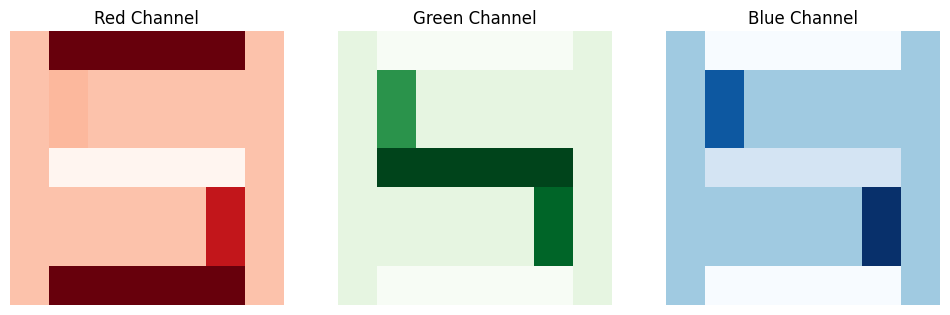

In [5]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))

ax[0].imshow(s_color_img[:, :, 0], cmap='Reds')
ax[0].set_title('Red Channel')
ax[0].axis('off')

ax[1].imshow(s_color_img[:, :, 1], cmap='Greens')
ax[1].set_title('Green Channel')
ax[1].axis('off')

ax[2].imshow(s_color_img[:, :, 2], cmap='Blues')
ax[2].set_title('Blue Channel')
ax[2].axis('off')

plt.show()

### Load and display image

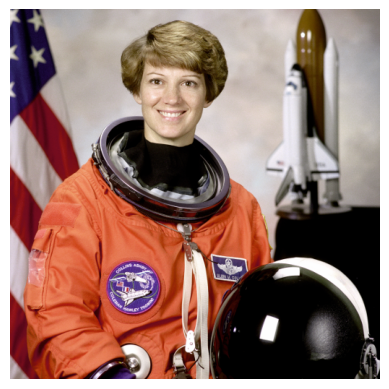

In [6]:
astro = data.astronaut()
plt.imshow(astro, cmap='binary')
plt.axis('off')
plt.show()

In [7]:
print(f'the dtype of astro image is {astro.dtype}')
print(f'the shape of astro image is {astro.shape}')

the dtype of astro image is uint8
the shape of astro image is (512, 512, 3)


In [8]:
astro

array([[[154, 147, 151],
        [109, 103, 124],
        [ 63,  58, 102],
        ...,
        [127, 120, 115],
        [120, 117, 106],
        [125, 119, 110]],

       [[177, 171, 171],
        [144, 141, 143],
        [113, 114, 124],
        ...,
        [127, 118, 112],
        [124, 115, 108],
        [121, 116, 105]],

       [[201, 194, 193],
        [182, 178, 175],
        [168, 165, 164],
        ...,
        [128, 120, 117],
        [126, 116, 112],
        [124, 114, 109]],

       ...,

       [[186, 170, 176],
        [186, 170, 177],
        [183, 168, 170],
        ...,
        [  0,   0,   0],
        [  0,   0,   1],
        [  0,   0,   0]],

       [[183, 169, 170],
        [182, 167, 171],
        [185, 164, 176],
        ...,
        [  0,   0,   1],
        [  1,   1,   1],
        [  0,   0,   0]],

       [[184, 167, 172],
        [183, 165, 169],
        [180, 162, 171],
        ...,
        [  0,   0,   0],
        [  1,   1,   1],
        [  0,   0,   0]]

### Reading Image from disk

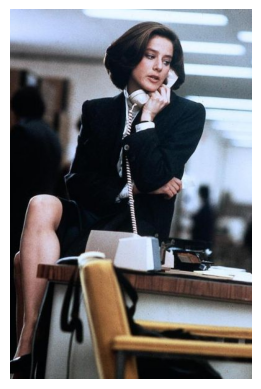

In [9]:
girl = io.imread(r'C:\Users\Marven\Desktop\image processing project\2b0db9f3f1b02dd9ce7b752c36852622.jpg')
plt.imshow(girl)
plt.axis('off')
plt.show()

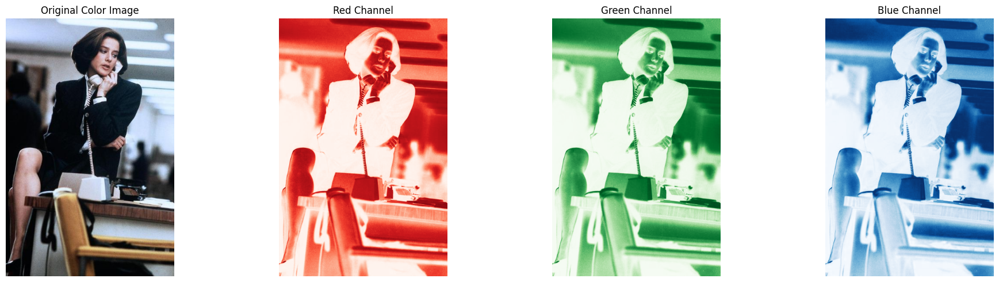

In [10]:
fig, ax = plt.subplots(1, 4, figsize=(20, 5))

ax[0].imshow(girl)
ax[0].set_title('Original Color Image')
ax[0].axis('off')

ax[1].imshow(girl[:, :, 0], cmap='Reds')
ax[1].set_title('Red Channel')
ax[1].axis('off')

ax[2].imshow(girl[:, :, 1], cmap='Greens')
ax[2].set_title('Green Channel')
ax[2].axis('off')

ax[3].imshow(girl[:, :, 2], cmap='Blues')
ax[3].set_title('Blue Channel')
ax[3].axis('off')

plt.tight_layout()
plt.show()

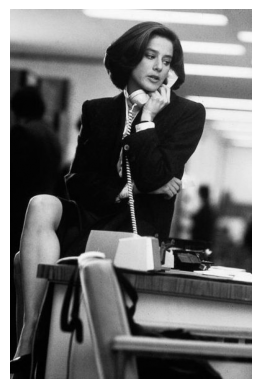

In [11]:
girl_gray = io.imread(r'C:\Users\Marven\Desktop\image processing project\2b0db9f3f1b02dd9ce7b752c36852622.jpg', as_gray=True)
plt.imshow(girl_gray,cmap='gray')
plt.axis('off')
plt.show()

In [12]:
print(f'the dtype of girl image is {girl.dtype}')
print(f'the shape of girl image is {girl.shape}')

the dtype of girl image is uint8
the shape of girl image is (596, 390, 3)


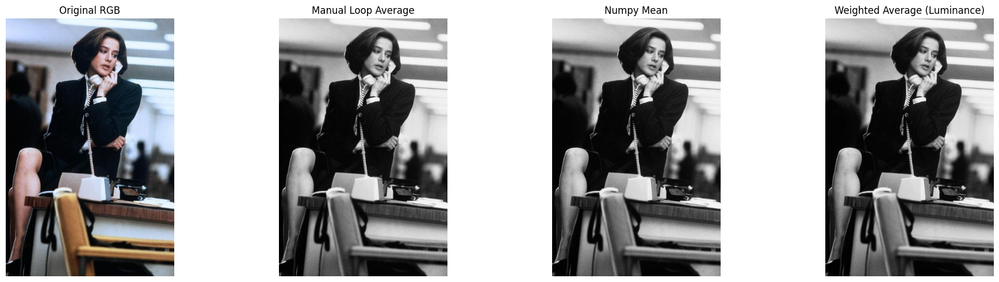

In [13]:
image_path = r'C:\Users\Marven\Desktop\image processing project\2b0db9f3f1b02dd9ce7b752c36852622.jpg'
rgb_image = io.imread(image_path)

# for loop
height, width, _ = rgb_image.shape
gray_manual = np.zeros((height, width), dtype=np.uint8)

for i in range(height):
    for j in range(width):
        r, g, b = map(int, rgb_image[i, j])
        gray_manual[i, j] = int((r + g + b) / 3)

#numpy mean
gray_mean = np.mean(rgb_image, axis=2).astype(np.uint8)

#Weighted Average (Luminance)
gray_weighted = (
    0.3 * rgb_image[..., 0] +
    0.59 * rgb_image[..., 1] +
    0.11 * rgb_image[..., 2]
).astype(np.uint8)

fig, ax = plt.subplots(1, 4, figsize=(20, 5))

ax[0].imshow(rgb_image)
ax[0].set_title("Original RGB")
ax[0].axis("off")

ax[1].imshow(gray_manual, cmap="gray")
ax[1].set_title("Manual Loop Average")
ax[1].axis("off")

ax[2].imshow(gray_mean, cmap="gray")
ax[2].set_title("Numpy Mean")
ax[2].axis("off")

ax[3].imshow(gray_weighted, cmap="gray")
ax[3].set_title("Weighted Average (Luminance)")
ax[3].axis("off")

plt.tight_layout()
plt.show()

# Point Operations

## 1. Arithmetic Operations

#### 1.1 Addition/Subtraction

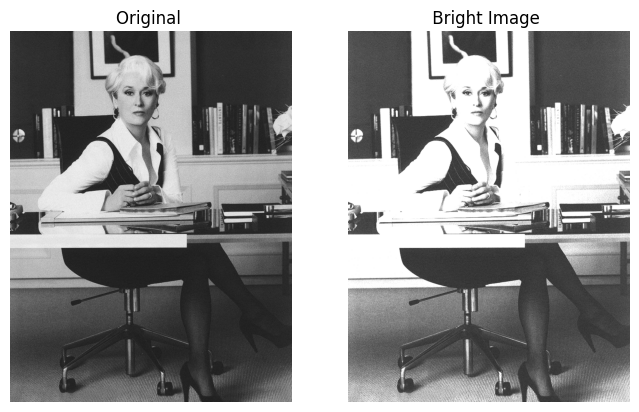

In [16]:
mirandapriestly = io.imread(r'C:\Users\Marven\Desktop\image processing project\2b2245560f345413b70e6c8980a0c129.jpg', as_gray=True)
mirandapriestly = (mirandapriestly * 255).astype(np.uint8)
bright_constant = 100
bright_mirandapriestly = np.zeros_like(mirandapriestly)
height, width = mirandapriestly.shape
for i in range(height):
    for j in range(width):
        pixel = int(mirandapriestly[i, j])  # Cast to int to avoid overflow
        bright_value = pixel + bright_constant
        bright_mirandapriestly[i, j] = min(bright_value, 255)
fig , axis=plt.subplots(1,2, figsize=(8,12))
axis[0].imshow(mirandapriestly, cmap='gray')
axis[0].set_title("Original ")
axis[0].axis("off")
axis[1].imshow(bright_mirandapriestly, cmap='gray')
axis[1].set_title(" Bright Image  ")
axis[1].axis("off")
plt.show()


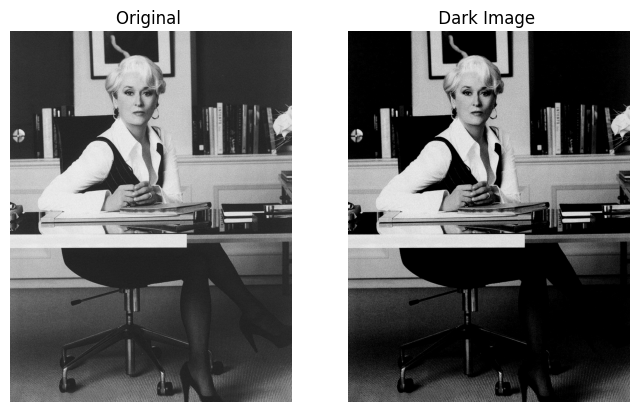

In [18]:
mirandapriestly = io.imread(r'C:\Users\Marven\Desktop\image processing project\2b2245560f345413b70e6c8980a0c129.jpg', as_gray=True)
mirandapriestly = (mirandapriestly * 255).astype(np.uint8)
dark_constant = 50
dark_mirandapriestly = np.zeros_like(mirandapriestly)
height, width = mirandapriestly.shape
for i in range(height):
    for j in range(width):
        pixel = int(mirandapriestly[i, j])  # Cast to int to avoid overflow
        dark_value = pixel - dark_constant
        dark_mirandapriestly[i, j] = max(dark_value, 0)
fig , axis=plt.subplots(1,2, figsize=(8,12))
axis[0].imshow(mirandapriestly, cmap='gray')
axis[0].set_title("Original ")
axis[0].axis("off")
axis[1].imshow(dark_mirandapriestly, cmap='gray')
axis[1].set_title(" Dark Image  ")
axis[1].axis("off")
plt.show()

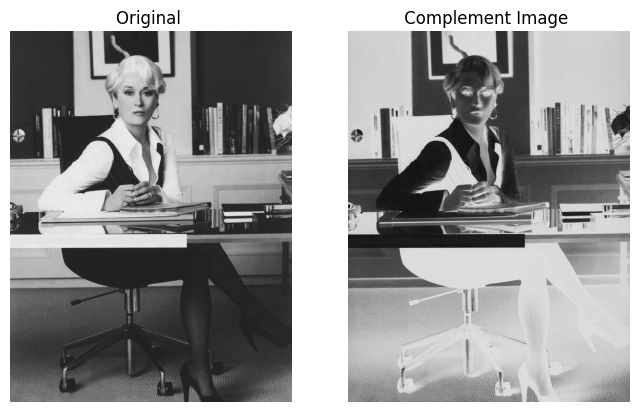

In [19]:
mirandapriestly = io.imread(r'C:\Users\Marven\Desktop\image processing project\2b2245560f345413b70e6c8980a0c129.jpg', as_gray=True)
mirandapriestly = (mirandapriestly * 255).astype(np.uint8)
complement_mirandapriestly= np.zeros_like(mirandapriestly)
height, width = mirandapriestly.shape
for i in range(height):
    for j in range(width):
        pixel = int(mirandapriestly[i, j])  # Cast to int to avoid overflow
        complement_mirandapriestly[i, j] = 255 - pixel
fig , axis=plt.subplots(1,2, figsize=(8,12))
axis[0].imshow(mirandapriestly, cmap='gray')
axis[0].set_title("Original ")
axis[0].axis("off")
axis[1].imshow(complement_mirandapriestly, cmap='gray')
axis[1].set_title(" Complement Image  ")
axis[1].axis("off")
plt.show()

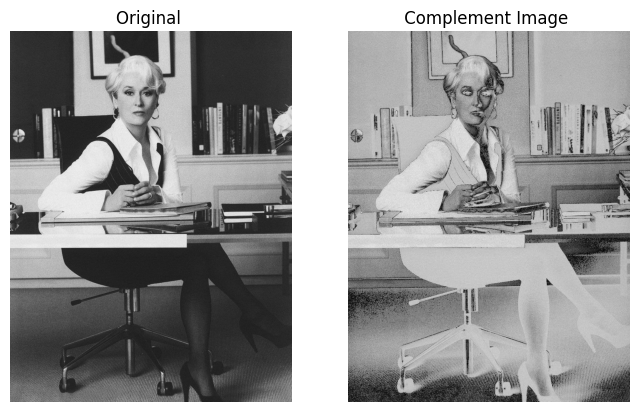

In [20]:
mirandapriestly = io.imread(r'C:\Users\Marven\Desktop\image processing project\2b2245560f345413b70e6c8980a0c129.jpg', as_gray=True)
mirandapriestly = (mirandapriestly * 255).astype(np.uint8)
complement_mirandapriestly = np.zeros_like(mirandapriestly)
height, width = mirandapriestly.shape
threshold = 100
for i in range(height):
    for j in range(width):
        pixel = int(mirandapriestly[i, j])  # Cast to int to avoid overflow
        if pixel < threshold:
          complement_mirandapriestly[i, j] = 255 - pixel
        else:
          complement_mirandapriestly[i, j] = pixel
fig , axis=plt.subplots(1,2, figsize=(8,12))
axis[0].imshow(mirandapriestly, cmap='gray')
axis[0].set_title("Original ")
axis[0].axis("off")
axis[1].imshow(complement_mirandapriestly, cmap='gray')
axis[1].set_title(" Complement Image  ")
axis[1].axis("off")
plt.show()

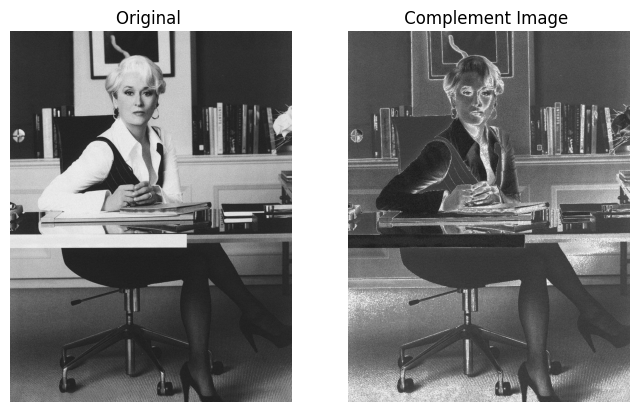

In [21]:
mirandapriestly = io.imread(r'C:\Users\Marven\Desktop\image processing project\2b2245560f345413b70e6c8980a0c129.jpg', as_gray=True)
mirandapriestly = (mirandapriestly * 255).astype(np.uint8)
complement_mirandapriestly = np.zeros_like(mirandapriestly)
height, width = mirandapriestly.shape
threshold = 100
for i in range(height):
    for j in range(width):
        pixel = int(mirandapriestly[i, j])  # Cast to int to avoid overflow
        if pixel > threshold:
          complement_mirandapriestly[i, j] = 255 - pixel
        else:
          complement_mirandapriestly[i, j] = pixel
fig , axis=plt.subplots(1,2, figsize=(8,12))
axis[0].imshow(mirandapriestly, cmap='gray')
axis[0].set_title("Original ")
axis[0
].axis(
"off")
axis[1
].imshow(complement_mirandapriestly, cmap='gray')
axis[1].set_title(" Complement Image  ")
axis[1
].axis("off")
plt.show()

# Image Histogram

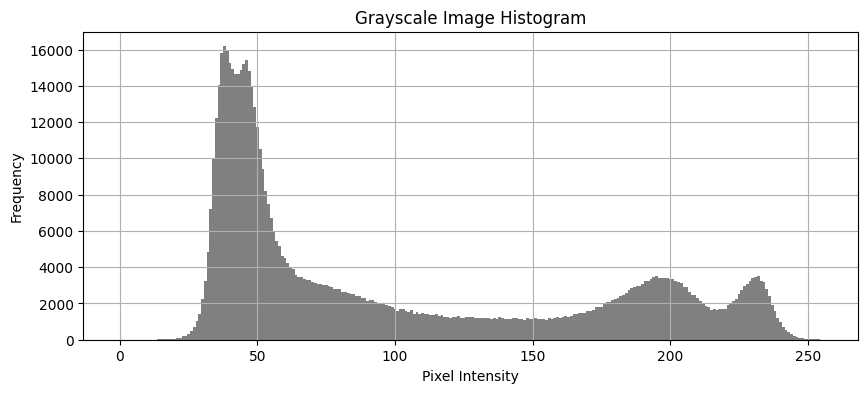

In [22]:
mirandapriestly = io.imread(r'C:\Users\Marven\Desktop\image processing project\2b2245560f345413b70e6c8980a0c129.jpg', as_gray=True)
mirandapriestly_int = img_as_ubyte(mirandapriestly)
histogram = np.zeros(256, dtype=int)
height, width = mirandapriestly_int.shape
for i in range(height):
    for j in range(width):
        intensity = mirandapriestly_int[i, j]
        histogram[intensity] += 1
plt.figure(figsize=(10, 4))
plt.bar(range(256), histogram, width=1.0, color='gray')
plt.title("Grayscale Image Histogram")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()


# Blending/Adding Images

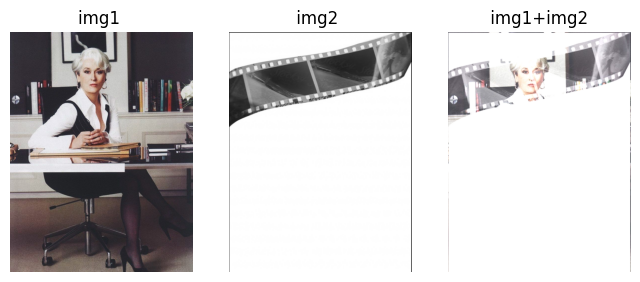

In [23]:
img1 = io.imread(r'C:\Users\Marven\Desktop\image processing project\2b2245560f345413b70e6c8980a0c129.jpg')# Ensure images are of the same size
img2 = io.imread(r'C:\Users\Marven\Desktop\image processing project\Screenshot 2026-04-25 010713.png', as_gray=True)
img2 = resize(img2, img1.shape)
img2 = (resize(img2, img1.shape) * 255).astype(np.uint8)
added_img = np.zeros_like(img1)
height, width, channels = img1.shape
# Loop through pixels
for i in range(height):
  for j in range(width):
    for c in range(3):
        summed = int(img1[i][j][c]) + int(img2[i][j][c])
        added_img[i][j][c] = min(summed, 255)
# display images
fig , axis=plt.subplots(1,3, figsize=(8,12))
axis[0].imshow(img1)
axis[0].set_title("img1 ")
axis[0].axis("off")
axis[1].imshow(img2)
axis[1].set_title(" img2  ")
axis[1].axis("off")
axis[2].imshow(added_img)
axis[2].set_title(" img1+img2 ")
axis[2].axis("off")
plt.show()


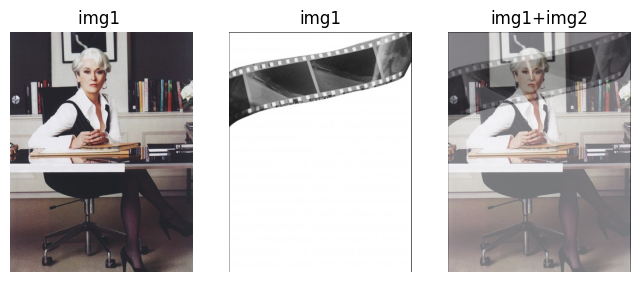

In [24]:
img1 = io.imread(r'C:\Users\Marven\Desktop\image processing project\2b2245560f345413b70e6c8980a0c129.jpg')# Ensure images are of the same size
img2 = io.imread(r'C:\Users\Marven\Desktop\image processing project\Screenshot 2026-04-25 010713.png', as_gray=True)
# Ensure images are of the same size
img2 = resize(img2, img1.shape)
img2 = (resize(img2, img1.shape) * 255).astype(np.uint8)
added_img = np.zeros_like(img1)
height, width, channels = img1.shape
# Loop through pixels
for i in range(height):
  for j in range(width):
    for c in range(3):  # RGB channels
        summed = 0.6 * int(img1[i][j][c]) + 0.4 * int(img2[i][j][c])
        added_img[i][j][c] = min(summed, 255)
fig , axis=plt.subplots(1,3, figsize=(8,12))
axis[0].imshow(img1)
axis[0].set_title("img1 ")
axis[0].axis("off")
axis[1].imshow(img2)
axis[1].set_title("img1")
axis[1].axis("off")
axis[2].imshow(added_img)
axis[2].set_title("img1+img2")
axis[2].axis("off")
plt.show()


# Background/Image Subtraction

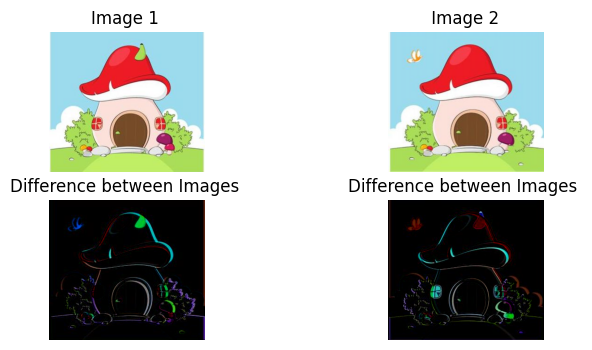

In [25]:
# Load two images###############################################
img1 = io.imread(r'C:\Users\Marven\Desktop\image processing project\WhatsApp Image 2026-04-26 at 11.39.14 AM.jpeg')# Ensure images are of the same size
img2 = io.imread(r'C:\Users\Marven\Desktop\image processing project\WhatsApp Image 2026-04-26 at 11.39.29 AM.jpeg')
# Ensure images are of the same size
# Ensure images are of the same size
img2 =resize(img2, img1.shape)
img2 =(resize(img2, img1.shape) * 255).astype(np.uint8)
subtracted1_img =np.zeros_like(img1)
subtracted2_img =np.zeros_like(img1)
height, width, channels =img1.shape
# Loop through pixels
for i in range(height):
        for j in range(width):
            for c in range(3):
                subtract = int(img1[i][j][c]) - int(img2[i][j][c])
                subtracted1_img[i][j][c] = max(subtract, 0)
# Loop through pixels
for i in range(height):
        for j in range(width):
            for c in range(3):
                subtract = int(img2[i][j][c]) - int(img1[i][j][c])
                subtracted2_img[i][j][c] = max(subtract, 0)
# display images
fig , axis=plt.subplots(2,2, figsize=(8,4))
axis[0][0].imshow(img1)
axis[0][0].set_title("Image 1 ")
axis[0][0].axis("off")
axis[0][1].imshow(img2)
axis[0][1].set_title(" Image 2 ")
axis[0][1].axis("off")
axis[1][0].imshow(subtracted1_img)
axis[1][0].set_title("Difference between Images ")
axis[1][0].axis("off")
axis[1][1].imshow(subtracted2_img)
axis[1][1].set_title("Difference between Images ")
axis[1][1].axis("off")
plt.show()

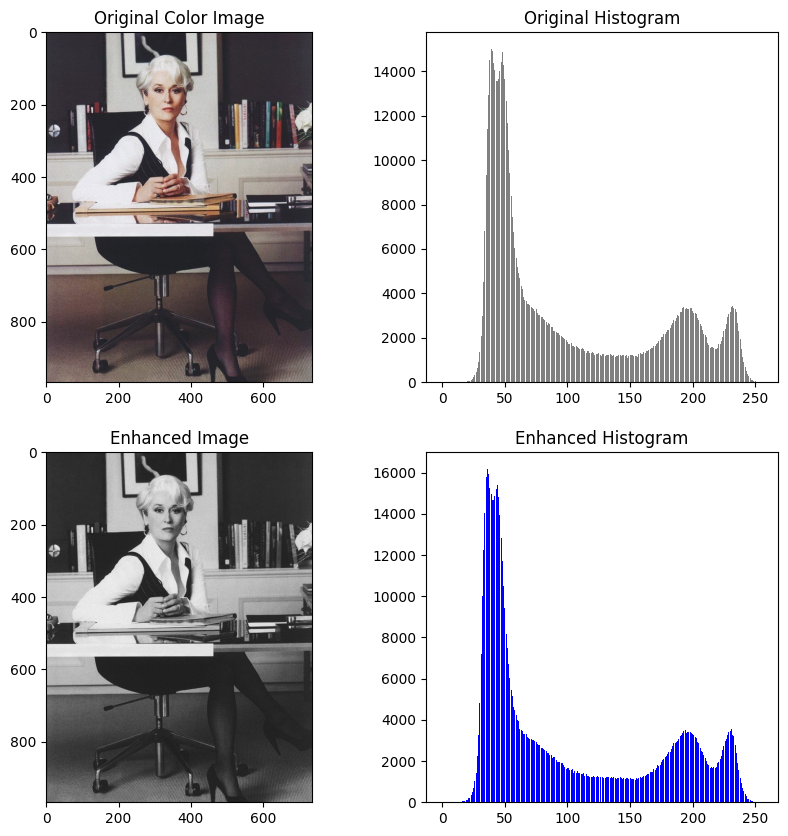

In [26]:
def compute_histogram(mirandapriestly):
    histogram = np.zeros(256, dtype=int)
    height = mirandapriestly.shape[0]
    width = mirandapriestly.shape[1]
    
    for i in range(height):
        for j in range(width):
            if len(mirandapriestly.shape) == 3:
                pixel = int(np.mean(mirandapriestly[i, j]))
            else:
                pixel = mirandapriestly[i, j]
            histogram[pixel] += 1
    return histogram

def histogram_streching(mirandapriestly):
    height = mirandapriestly.shape[0]
    width = mirandapriestly.shape[1]
    
    if len(mirandapriestly.shape) == 3:
        mirandapriestly = img_as_ubyte(color.rgb2gray(mirandapriestly))
        
    I_min = 255
    I_max = 0
    for i in range(height):
        for j in range(width):
            pixel = mirandapriestly[i][j]
            if pixel < I_min:
                I_min = pixel
            if pixel > I_max:
                I_max = pixel
                
    stretched = np.zeros((height, width), dtype=np.uint8)
    for i in range(height):
        for j in range(width):
            pixel = mirandapriestly[i][j]
            if I_max != I_min:
                new_pixel = int((int(pixel) - int(I_min)) * 255 / (int(I_max) - int(I_min)))
            else:
                new_pixel = pixel
            stretched[i][j] = min(max(new_pixel, 0), 255)
    return stretched

original_img = io.imread(r'C:\Users\Marven\Desktop\image processing project\2b2245560f345413b70e6c8980a0c129.jpg')

original_hist = compute_histogram(original_img)
enhanced_img = histogram_streching(original_img)
enhanced_hist = compute_histogram(enhanced_img)

fig, ax = plt.subplots(2, 2, figsize=(10, 10))

if len(original_img.shape) == 3:
    ax[0][0].imshow(original_img)
    ax[0][0].set_title("Original Color Image")
else:
    ax[0][0].imshow(original_img, cmap='gray')
    ax[0][0].set_title("Original Gray Image")

ax[0][1].bar(range(256), original_hist, color='gray')
ax[0][1].set_title("Original Histogram")

ax[1][0].imshow(enhanced_img, cmap='gray')
ax[1][0].set_title("Enhanced Image")

ax[1][1].bar(range(256), enhanced_hist, color='blue')
ax[1][1].set_title("Enhanced Histogram")

plt.show()

# Simple Neighbourhood Operations

### Mean Filter

Original image shape: (256, 256)
Mean filtered image shape: (254, 254)


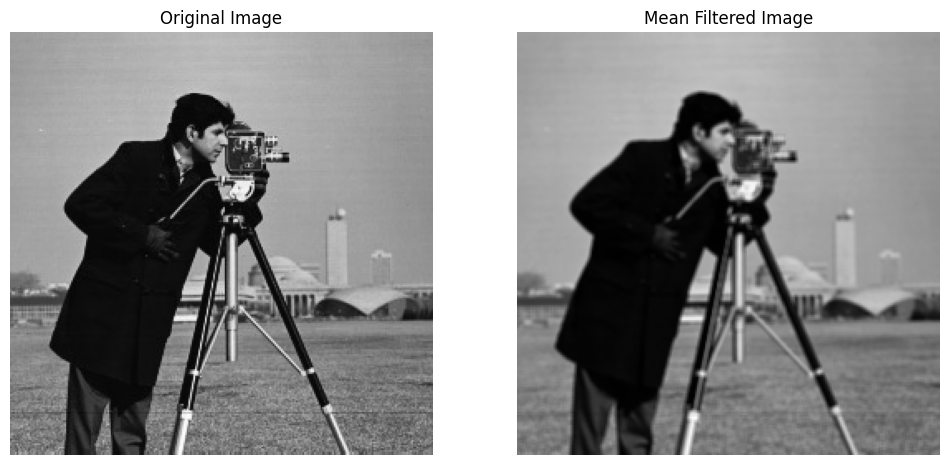

In [27]:
def mean_filter(image, zero_padding=True):
    image = img_as_ubyte(image)
    height, width = image.shape
    
    if zero_padding:
        padded_img = np.zeros((height + 2, width + 2), dtype=np.uint8)
        padded_img[1:-1, 1:-1] = image
        unfiltered_img = padded_img
        filtered_img = np.zeros((height, width), dtype=np.uint8)
        rows, cols = height + 1, width + 1
    else:
        unfiltered_img = image
        filtered_img = np.zeros((height - 2, width - 2), dtype=np.uint8)
        rows, cols = height - 1, width - 1
        
    for i in range(1, rows):
        for j in range(1, cols):
            neighbor = [
                unfiltered_img[i-1, j-1], unfiltered_img[i-1, j], unfiltered_img[i-1, j + 1],
                unfiltered_img[i, j-1],   unfiltered_img[i, j],   unfiltered_img[i, j + 1],
                unfiltered_img[i + 1, j-1], unfiltered_img[i + 1, j], unfiltered_img[i + 1, j + 1]
            ]
            avg = sum(map(int, neighbor)) // 9
            filtered_img[i - 1, j - 1] = avg
            
    return filtered_img

salt_pepper_image = io.imread( r'C:\Users\Marven\Desktop\image processing project\WhatsApp Image 2026-04-25 at 6.31.20 PM.jpeg', as_gray=True)

mean_img = mean_filter(salt_pepper_image, zero_padding=False)

print(f'Original image shape: {salt_pepper_image.shape}')
print(f'Mean filtered image shape: {mean_img.shape}')

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(salt_pepper_image, cmap='gray')
ax[0].set_title('Original Image')
ax[0].axis('off')

ax[1].imshow(mean_img, cmap='gray')
ax[1].set_title('Mean Filtered Image')
ax[1].axis('off')

plt.show()

### Median Filter

original image shape:(256, 256), median filtered image shape:(256, 256)


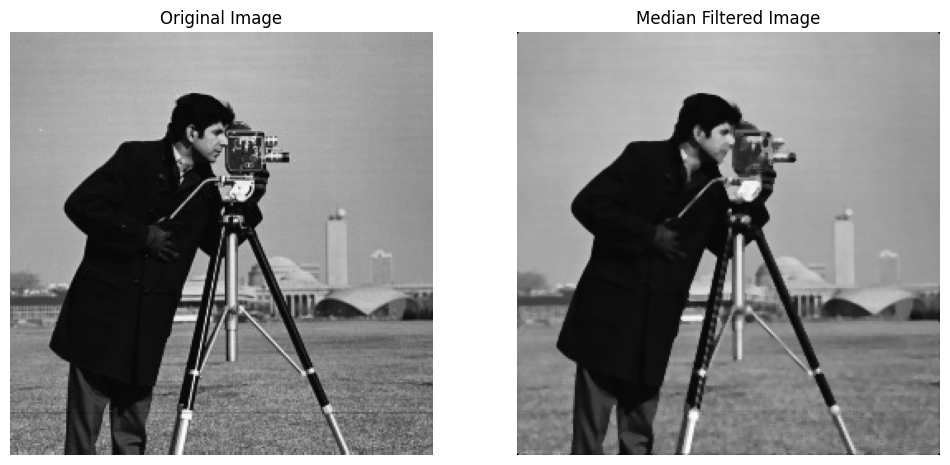

In [29]:
def median_filter(image, zero_padding=True):
    if len(image.shape) == 3:
        image = img_as_ubyte(color.rgb2gray(image))
    else:
        image = img_as_ubyte(image)

    height, width = image.shape
    if zero_padding:
        padded_img = np.zeros((height + 2, width + 2), dtype=np.uint8)
        padded_img[1:-1, 1:-1] = image
        unfiltered_img = padded_img
        filtered_img = np.zeros((height, width), dtype=np.uint8)
        rows, cols = height + 1, width + 1
    else:
        unfiltered_img = image
        filtered_img = np.zeros((height - 2, width - 2), dtype=np.uint8)
        rows, cols = height - 1, width - 1
        
    for i in range(1, rows):
        for j in range(1, cols):
            neighbor = [unfiltered_img[i-1, j-1],   unfiltered_img[i-1, j],   unfiltered_img[i-1, j + 1],
                        unfiltered_img[i, j-1],     unfiltered_img[i, j],     unfiltered_img[i, j + 1],
                        unfiltered_img[i + 1, j-1], unfiltered_img[i + 1, j], unfiltered_img[i + 1, j + 1]]
            
            neighbor.sort()
            filtered_img[i - 1, j - 1] = neighbor[4]
            
    return filtered_img

salt_pepper_image = io.imread( r'C:\Users\Marven\Desktop\image processing project\WhatsApp Image 2026-04-25 at 6.31.20 PM.jpeg', as_gray=True)

median_img = median_filter(salt_pepper_image, True)

print(f'original image shape:{salt_pepper_image.shape}, median filtered image shape:{median_img.shape}')
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ax[0].imshow(salt_pepper_image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')

ax[1].imshow(median_img, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Median Filtered Image')

plt.show()

### Min Filter

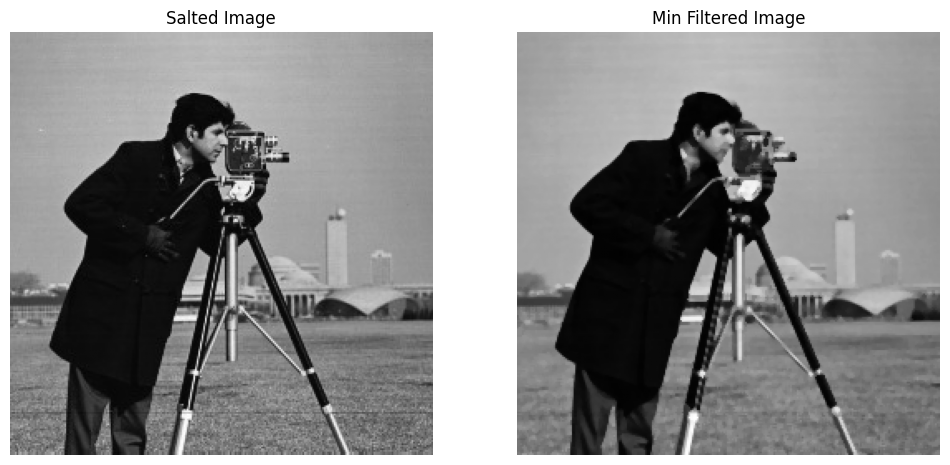

In [31]:
def min_filter(image, zero_padding=True):
    height, width = image.shape
    if zero_padding:
        padded_img = np.zeros((height + 2, width + 2), dtype=np.uint8)
        padded_img[1:-1, 1:-1] = image
        unfiltered_img = padded_img
        filtered_img = np.zeros((height, width), dtype=np.uint8)
        rows, cols = height + 1, width + 1
    else:
        unfiltered_img = image
        filtered_img = np.zeros((height - 2, width - 2), 
dtype=np.uint8)
        rows, cols = height - 1, width - 1
    for i in range(1, rows):
        for j in range(1, cols):
            neighbor = [unfiltered_img[i-1, j-1],   unfiltered_img[i-1, j],   unfiltered_img[i-1, j + 1], unfiltered_img[i, j-1],     unfiltered_img[i, j],     unfiltered_img[i, j + 1], unfiltered_img[i + 1, j-1], unfiltered_img[i + 1, j], unfiltered_img[i + 1, j + 1]]
            min_val = min(neighbor)
            filtered_img[i - 1, j - 1] = min_val
    return filtered_img
salted_img = io.imread( r'C:\Users\Marven\Desktop\image processing project\WhatsApp Image 2026-04-25 at 6.31.20 PM.jpeg', as_gray=True)
min_img = median_filter(salted_img, False)
fig, ax = plt.subplots(1,2, figsize=(12,6))
ax[0].imshow(salted_img, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Salted Image')
ax[1].imshow(min_img, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Min Filtered Image')
plt.show()


### Max Filter

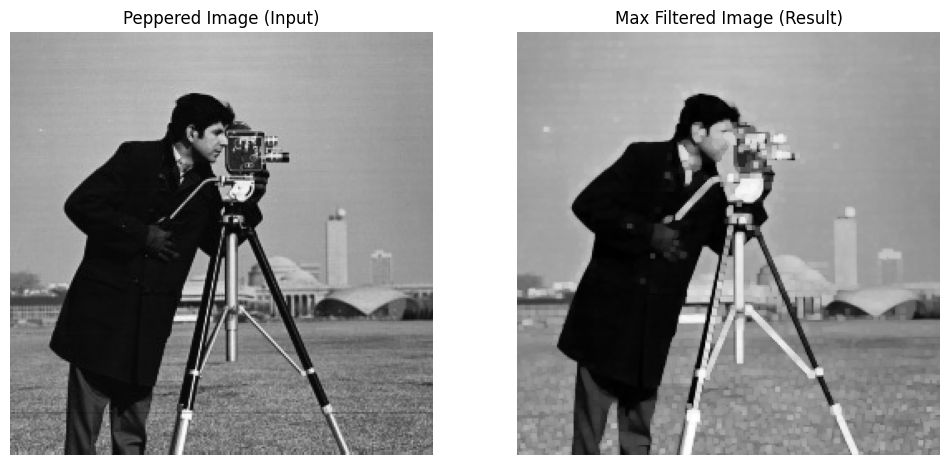

In [32]:
def max_filter(image, zero_padding=True):
    if image.dtype != np.uint8:
        image = img_as_ubyte(image)
        
    height, width = image.shape
    if zero_padding:
        padded_img = np.zeros((height + 2, width + 2), dtype=np.uint8)
        padded_img[1:-1, 1:-1] = image
        unfiltered_img = padded_img
        filtered_img = np.zeros((height, width), dtype=np.uint8)
        rows, cols = height + 1, width + 1
    else:
        unfiltered_img = image
        filtered_img = np.zeros((height - 2, width - 2), dtype=np.uint8)
        rows, cols = height - 1, width - 1
        
    for i in range(1, rows):
        for j in range(1, cols):
            neighbor = [unfiltered_img[i-1, j-1],   unfiltered_img[i-1, j],   unfiltered_img[i-1, j + 1],
                        unfiltered_img[i, j-1],     unfiltered_img[i, j],     unfiltered_img[i, j + 1],
                        unfiltered_img[i + 1, j-1], unfiltered_img[i + 1, j], unfiltered_img[i + 1, j + 1]]
            max_val = max(neighbor)
            filtered_img[i - 1, j - 1] = max_val
    return filtered_img

peppered_img = io.imread(r'C:\Users\Marven\Desktop\image processing project\WhatsApp Image 2026-04-25 at 6.31.20 PM.jpeg', as_gray=True)

max_img = max_filter(peppered_img, False)


fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(peppered_img, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Peppered Image (Input)')

ax[1].imshow(max_img, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Max Filtered Image (Result)')
plt.show()

# Spatial filtering

### Convolution

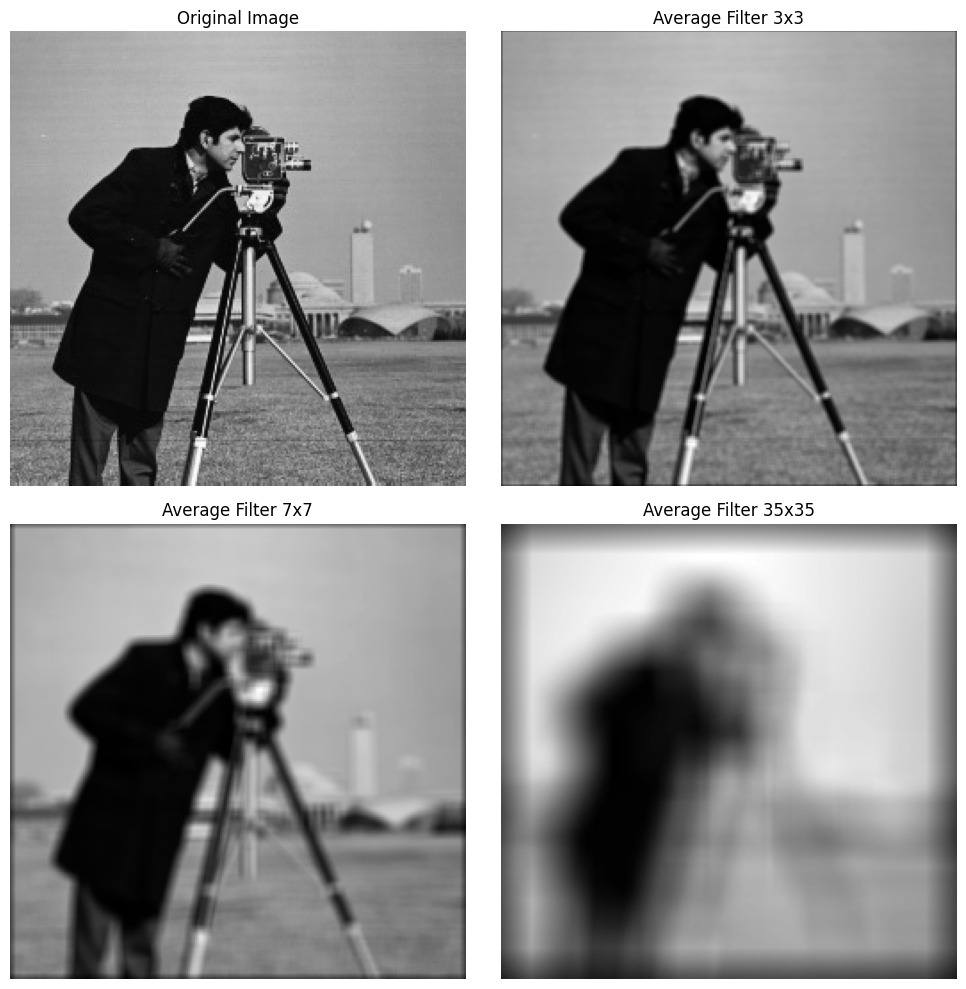

In [35]:
def convolve(image, filter):
    image = image.astype(np.float32)
    h, w = image.shape
    filter_size = filter.shape[0]
    pad = filter_size // 2
    
    padded_img = np.zeros((h + 2*pad, w + 2*pad), dtype=np.float32)
    padded_img[pad:pad+h, pad:pad+w] = image
    
    filtered_img = np.zeros((h, w), dtype=np.float32)
    
    for i in range(h):
        for j in range(w):
            n = padded_img[i:i+filter_size, j:j+filter_size]
            conv = np.sum(n * filter)
            filtered_img[i, j] = conv
            
    return np.clip(filtered_img, 0, 255).astype(np.uint8)

def average_filter(filter_size=3):
    mask = np.ones((filter_size, filter_size), dtype=float)
    mask /= (filter_size * filter_size)
    return mask

img = io.imread(r'C:\Users\Marven\Desktop\image processing project\WhatsApp Image 2026-04-25 at 6.31.20 PM.jpeg', as_gray=True)
img = (img * 255).astype(np.uint8) 

average_filtered_img_3 = convolve(img, average_filter(3))
average_filtered_img_7 = convolve(img, average_filter(7))
average_filtered_img_35 = convolve(img, average_filter(35))

fig, ax = plt.subplots(2, 2, figsize=(10, 10))

ax[0][0].imshow(img, cmap='gray')
ax[0][0].axis('off')
ax[0][0].set_title('Original Image')

ax[0][1].imshow(average_filtered_img_3, cmap='gray')
ax[0][1].axis('off')
ax[0][1].set_title('Average Filter 3x3')

ax[1][0].imshow(average_filtered_img_7, cmap='gray')
ax[1][0].axis('off')
ax[1][0].set_title('Average Filter 7x7')

ax[1][1].imshow(average_filtered_img_35, cmap='gray')
ax[1][1].axis('off')
ax[1][1].set_title('Average Filter 35x35')

plt.tight_layout()
plt.show()

### Gaussian Smoothing

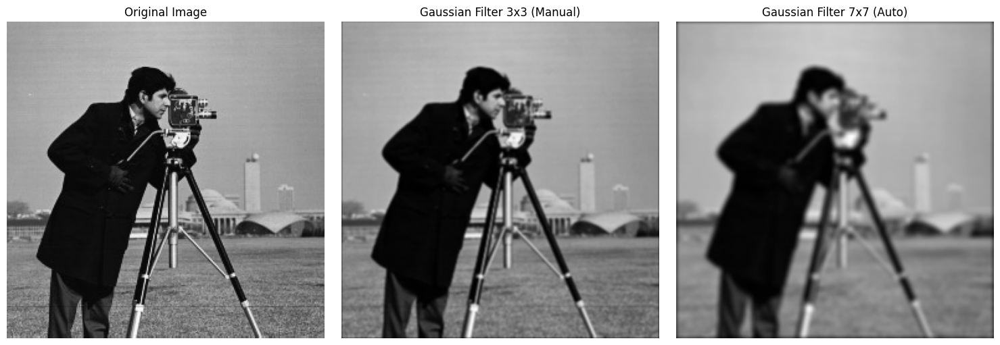

In [36]:
def convolve(image, filter):
    image = image.astype(np.float32)
    h, w = image.shape
    filter_size = filter.shape[0]
    pad = filter_size // 2
    padded_img = np.zeros((h + 2*pad, w + 2*pad), dtype=np.float32)
    padded_img[pad:pad+h, pad:pad+w] = image
    filtered_img = np.zeros((h, w), dtype=np.float32)
    for i in range(h):
        for j in range(w):
            n = padded_img[i:i+filter_size, j:j+filter_size]
            conv = np.sum(n * filter)
            filtered_img[i, j] = conv
    return np.clip(filtered_img, 0, 255).astype(np.uint8)

def gaussian_filter(filter_size, sigma):
    gauss_filter = np.zeros((filter_size, filter_size), np.float32)
    center = filter_size // 2
    
    for x in range(filter_size):
        for y in range(filter_size):
            x_coord = x - center
            y_coord = y - center
            
            x1 = 2 * np.pi * (sigma**2)
            x2 = np.exp(-(x_coord**2 + y_coord**2) / (2 * sigma**2))
            gauss_filter[x, y] = (1 / x1) * x2
            
    return gauss_filter / np.sum(gauss_filter)

img = io.imread(r'C:\Users\Marven\Desktop\image processing project\WhatsApp Image 2026-04-25 at 6.31.20 PM.jpeg', as_gray=True)
img = (img * 255).astype(np.uint8)

gauss_filter_3 = np.array([[1, 2, 1],
                           [2, 4, 2],
                           [1, 2, 1]], dtype=float)
gauss_filter_3 /= gauss_filter_3.sum()

gauss_filtered_img_3 = convolve(img, gauss_filter_3)
gauss_filtered_img_7 = convolve(img, gaussian_filter(7, 2))

fig, ax = plt.subplots(1, 3, figsize=(15, 5))

ax[0].imshow(img, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')

ax[1].imshow(gauss_filtered_img_3, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Gaussian Filter 3x3 (Manual)')

ax[2].imshow(gauss_filtered_img_7, cmap='gray')
ax[2].axis('off')
ax[2].set_title('Gaussian Filter 7x7 (Auto)')

plt.tight_layout()
plt.show()

# image restoration

## Noise

### salt & papper noise

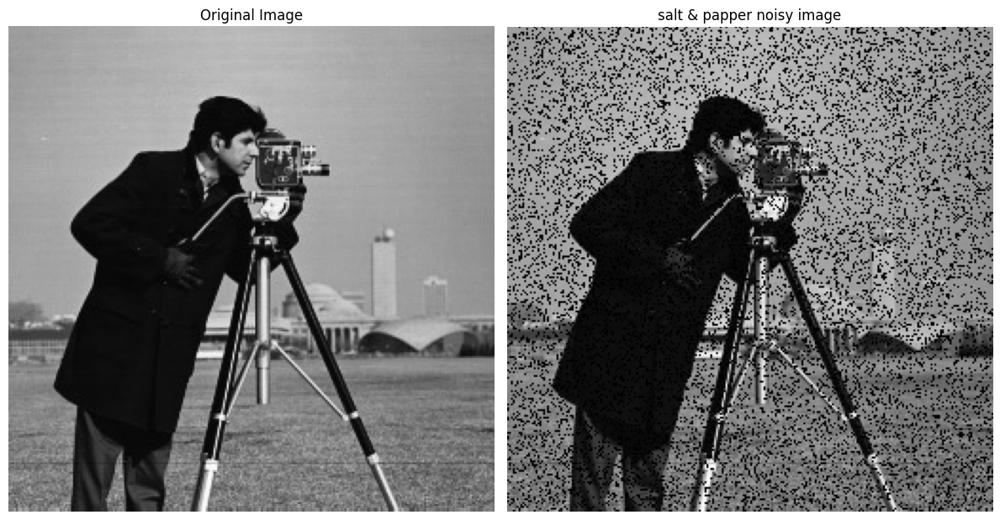

In [37]:
image = io.imread(r'C:\Users\Marven\Desktop\image processing project\WhatsApp Image 2026-04-25 at 6.31.20 PM.jpeg', as_gray=True)
h , w =image.shape
noisy_image=image.copy()
noise_ratio=0.2
total_pixels=image.size
num_noisy_pixels=int(noise_ratio * total_pixels)
salt_positions=np.random.randint(0 , total_pixels ,num_noisy_pixels )
noisy_image.flat[salt_positions]=255
papper_positions=np.random.randint(0 , total_pixels ,num_noisy_pixels )
noisy_image.flat[salt_positions]=0
fig, ax=plt.subplots(1,2, figsize=(12,8))
ax[0].imshow(image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')

ax[1].imshow(noisy_image, cmap='gray')
ax[1].axis('off')
ax[1].set_title('salt & papper noisy image')


plt.tight_layout()
plt.show()


# Filters used for noise removal

### Median filter

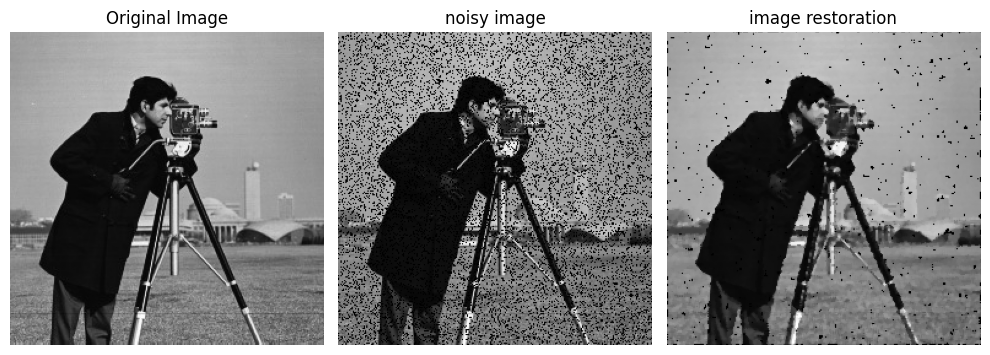

In [38]:
filter_size= 3
pad=filter_size//2
padded_h=h+2*pad
padded_w=w+2*pad
padded=np.zeros((padded_h,padded_w),dtype=np.float32)
padded[pad:pad+h,pad:pad+w]=noisy_image
restored_img=np.zeros_like(noisy_image)
for i in range (h):
    for j in range(w):
        window=padded[i:i+filter_size,j:j+filter_size]
        median_value=np.median(window)
        restored_img[i,j]=median_value
fig,ax=plt.subplots(1,3,figsize=(10,5))
ax[0].imshow(image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')

ax[1].imshow(noisy_image, cmap='gray')
ax[1].axis('off')
ax[1].set_title('noisy image')

ax[2].imshow(restored_img, cmap='gray')
ax[2].axis('off')
ax[2].set_title('image restoration')
plt.tight_layout()
plt.show()


### SNR(Signal-To-Noise Ratio)

In [39]:
original=image.astype(np.float32)
restored=restored_img.astype(np.float32)
num=np.sum(original * original)
den=np.sum((original-restored)**2)
snr_value=10*np.log10(num/den)
print("SNR = ", snr_value)

SNR =  14.977762699127197


# Morphological Operations 

### Dilation

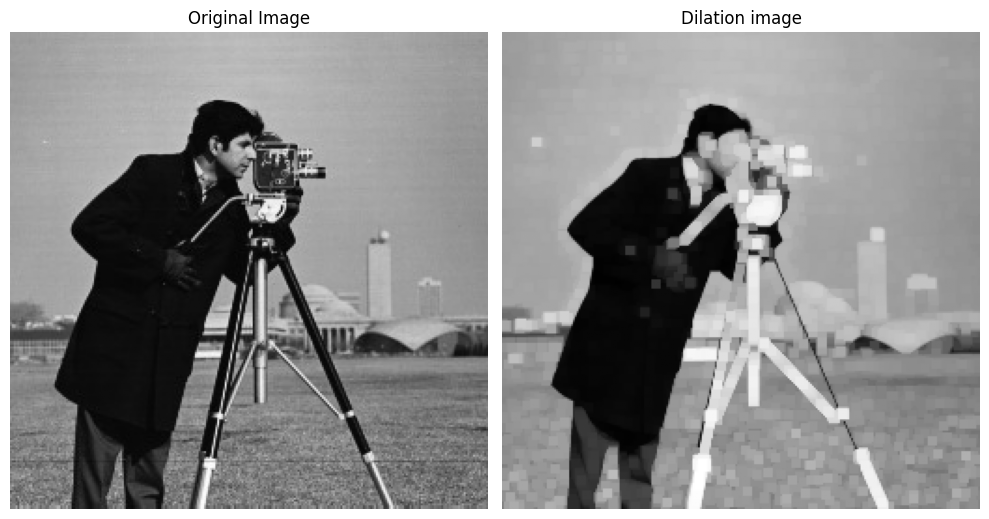

In [40]:
image = io.imread(r'C:\Users\Marven\Desktop\image processing project\WhatsApp Image 2026-04-25 at 6.31.20 PM.jpeg', as_gray=True)

stru_element=np.ones((5,5),dtype=np.uint8)
dilated=morphology.dilation(image,stru_element)
fig , ax = plt.subplots(1,2,figsize=(10,10))
ax[0].imshow(image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')

ax[1].imshow(dilated, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Dilation image')
plt.tight_layout()
plt.show()

### Erosion

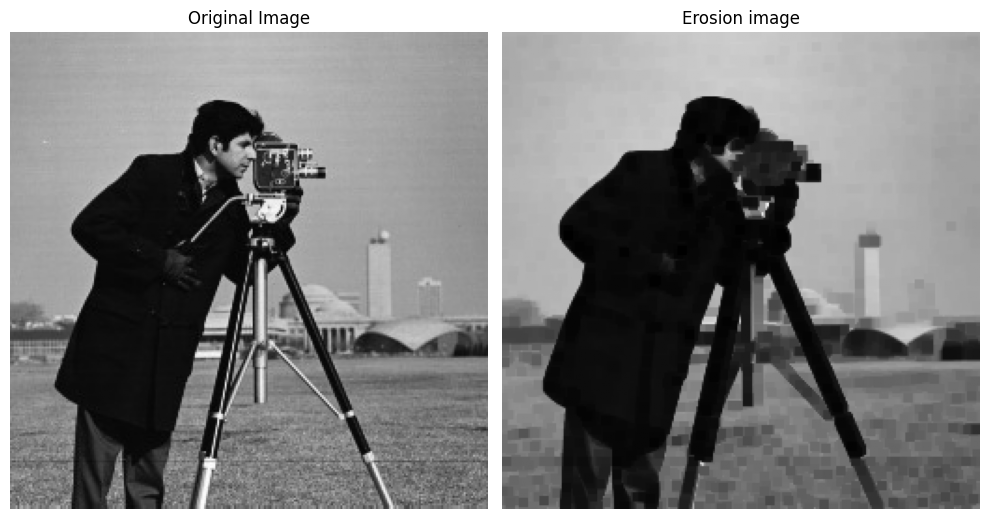

In [41]:
image = io.imread(r'C:\Users\Marven\Desktop\image processing project\WhatsApp Image 2026-04-25 at 6.31.20 PM.jpeg', as_gray=True)

stru_element=np.ones((5,5),dtype=np.uint8)
erosied=morphology.erosion(image,stru_element)
fig , ax = plt.subplots(1,2,figsize=(10,10))
ax[0].imshow(image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')

ax[1].imshow(erosied, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Erosion image')
plt.tight_layout()
plt.show()

### Opening

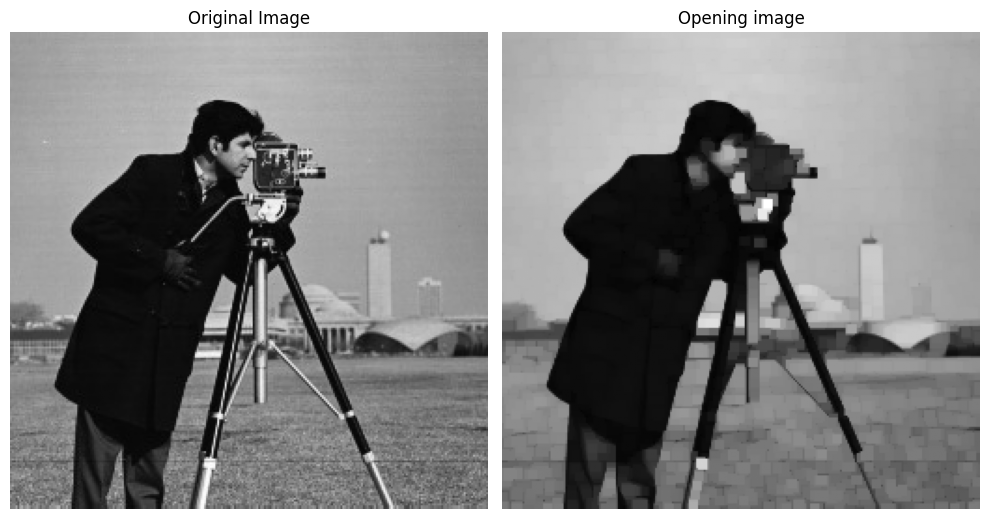

In [42]:
image = io.imread(r'C:\Users\Marven\Desktop\image processing project\WhatsApp Image 2026-04-25 at 6.31.20 PM.jpeg', as_gray=True)

stru_element=np.ones((5,5),dtype=np.uint8)
opened=morphology.opening(image,stru_element)
fig , ax = plt.subplots(1,2,figsize=(10,10))
ax[0].imshow(image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')

ax[1].imshow(opened, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Opening image')
plt.tight_layout()
plt.show()

### Closing

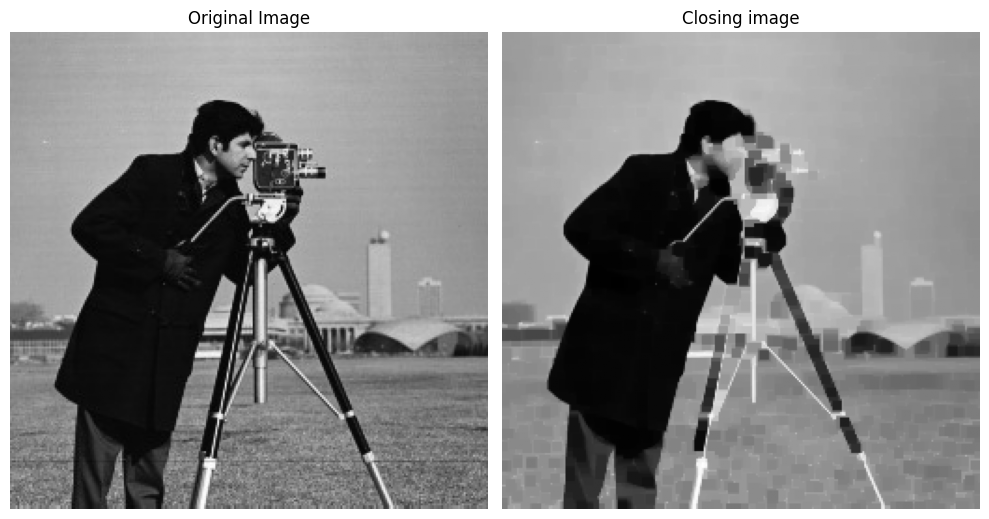

In [43]:
image = io.imread(r'C:\Users\Marven\Desktop\image processing project\WhatsApp Image 2026-04-25 at 6.31.20 PM.jpeg', as_gray=True)

stru_element=np.ones((5,5),dtype=np.uint8)
closed=morphology.closing(image,stru_element)
fig , ax = plt.subplots(1,2,figsize=(10,10))
ax[0].imshow(image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')

ax[1].imshow(closed, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Closing image')
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Closing image')

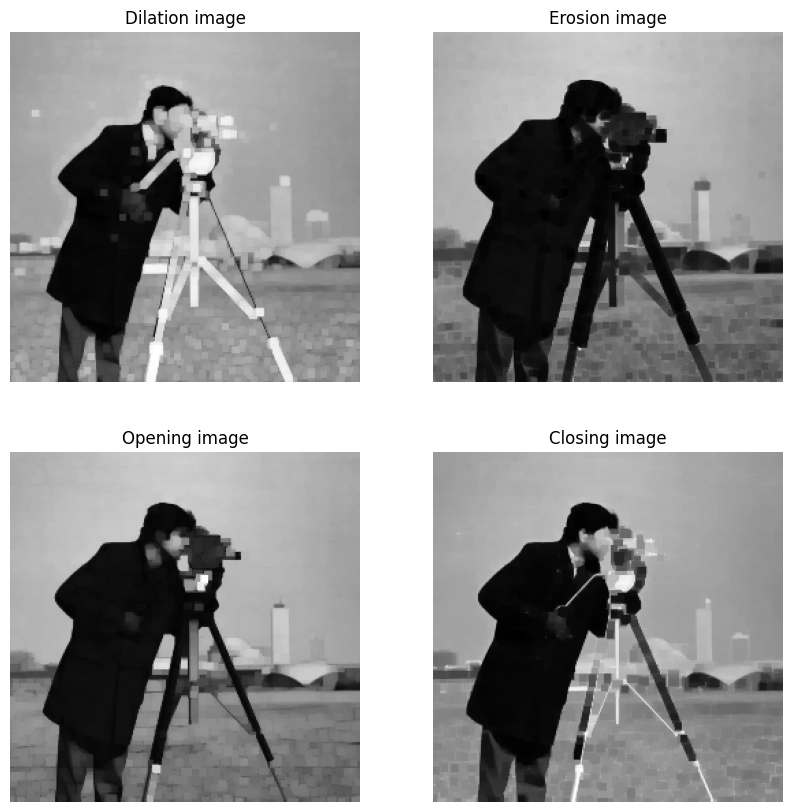

In [44]:
fig , ax = plt.subplots(2,2,figsize=(10,10))
ax[0][0].imshow(dilated, cmap='gray')
ax[0][0].axis('off')
ax[0][0].set_title('Dilation image')


ax[0][1].imshow(erosied, cmap='gray')
ax[0][1].axis('off')
ax[0][1].set_title('Erosion image')


ax[1][0].imshow(opened, cmap='gray')
ax[1][0].axis('off')
ax[1][0].set_title('Opening image')



ax[1][1].imshow(closed, cmap='gray')
ax[1][1].axis('off')
ax[1][1].set_title('Closing image')

# Segmentation

### 1. Automatic Thresholding Alg.(Otsu)

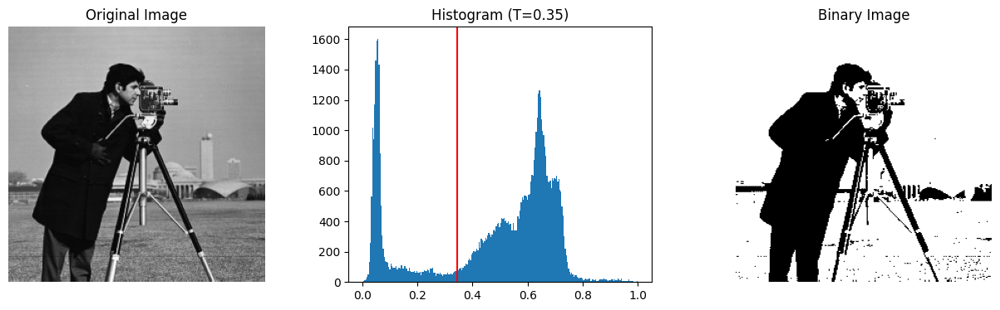

In [45]:
image = io.imread(r'C:\Users\Marven\Desktop\image processing project\WhatsApp Image 2026-04-25 at 6.31.20 PM.jpeg', as_gray=True)
T=filters.threshold_otsu(image)
binary=image>=T
fig , ax = plt.subplots(1,3,figsize=(16,4))
ax[0].imshow(image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')
ax[1].hist(image.ravel(),bins=256)
ax[1].axvline(T,color='red')
ax[1].set_title(f"Histogram (T={T:.2f})")
ax[2].imshow(binary, cmap='gray')
ax[2].axis('off')
ax[2].set_title('Binary Image')
plt.show()

### 2.Error Diffusion Dithering(Floyd-Steinberg)

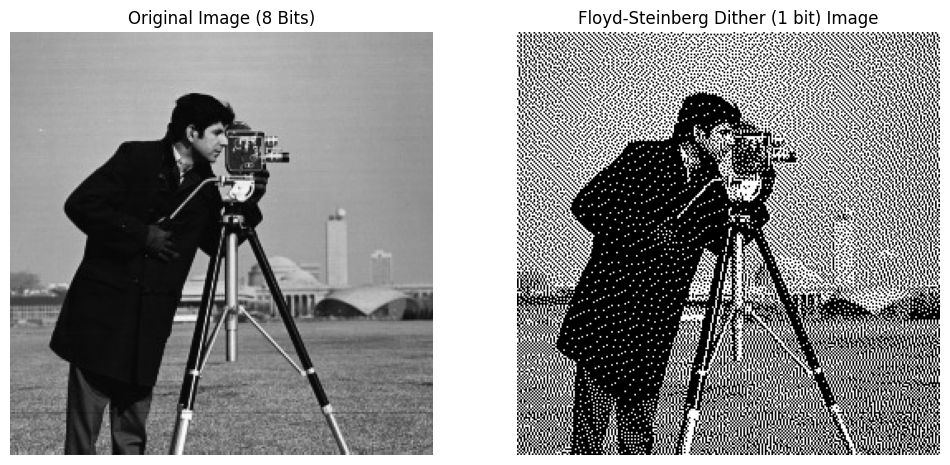

In [46]:
image = Image.open(r'C:\Users\Marven\Desktop\image processing project\WhatsApp Image 2026-04-25 at 6.31.20 PM.jpeg').convert('L')

dithered = image.convert('1', dither=Image.FLOYDSTEINBERG)

fig, ax = plt.subplots(1, 2, figsize=(12, 8))

ax[0].imshow(image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image (8 Bits)')

ax[1].imshow(dithered, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Floyd-Steinberg Dither (1 bit) Image')

plt.show()

# Edge Detection

### Prewitt Filter(extra)

In [47]:
image = io.imread(r'C:\Users\Marven\Desktop\image processing project\WhatsApp Image 2026-04-25 at 6.31.20 PM.jpeg', as_gray=True)

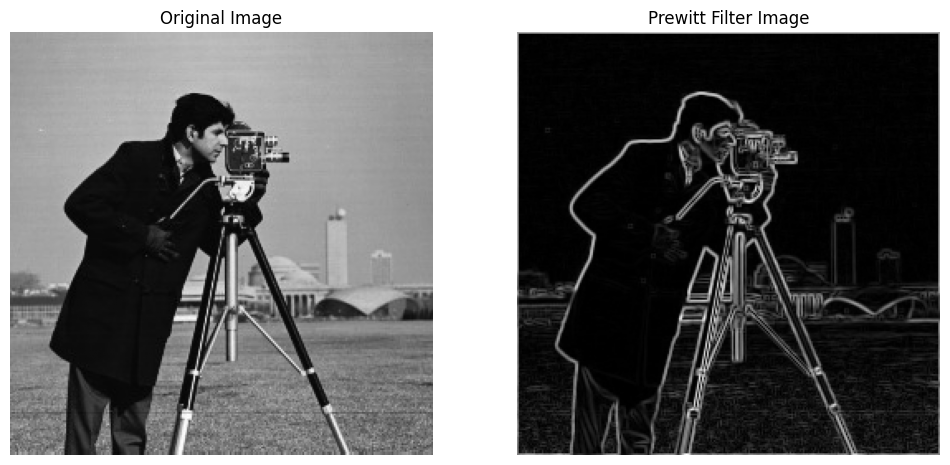

In [ ]:
def manual_prewitt(img):
    img = np.array(img, dtype=float)
    
    Kx = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
    Ky = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])
    
    Gx = convolve2d(img, Kx, mode='same')
    Gy = convolve2d(img, Ky, mode='same')
    
    magnitude = np.sqrt(Gx**2 + Gy**2)
    return magnitude

prewitt_result = manual_prewitt(image)

fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ax[0].imshow(image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')

ax[1].imshow(prewitt_result, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Prewitt Filter Image')

plt.show()

### Sobel Filter(extra)

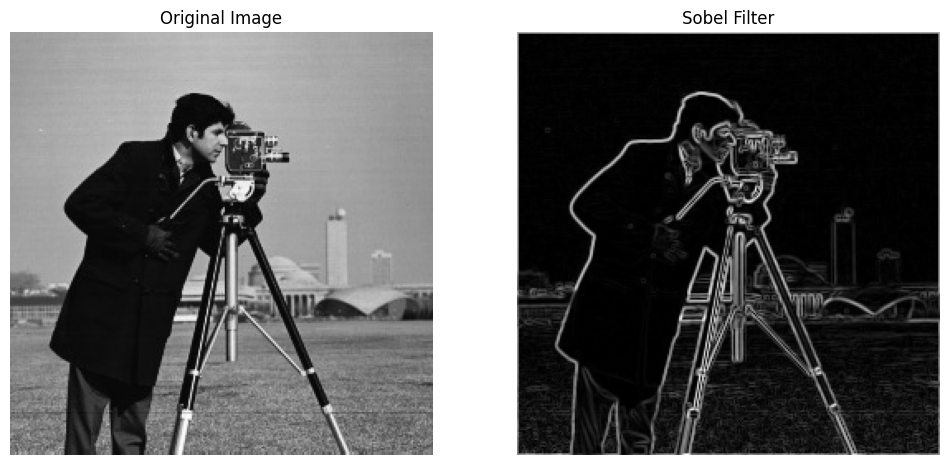

In [ ]:
def manual_sobel(img):
    img_f = np.array(img, dtype=float)
    Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])
    Gx = convolve2d(img_f, Kx, mode='same')
    Gy = convolve2d(img_f, Ky, mode='same')
    return np.sqrt(Gx**2 + Gy**2)

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')


ax[1].imshow(manual_sobel(image), cmap='gray')
ax[1].axis('off')
ax[1].set_title('Sobel Filter')
plt.show()

### Canny Edge Detection(extra)

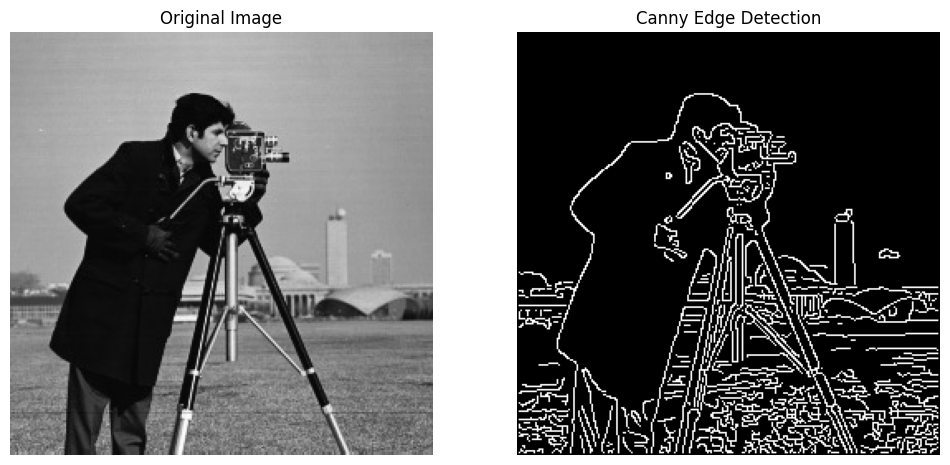

In [ ]:
edge_canny = feature.canny(image, sigma=1)

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')


ax[1].imshow(edge_canny, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Canny Edge Detection')
plt.show()

### Laplacian(extra)

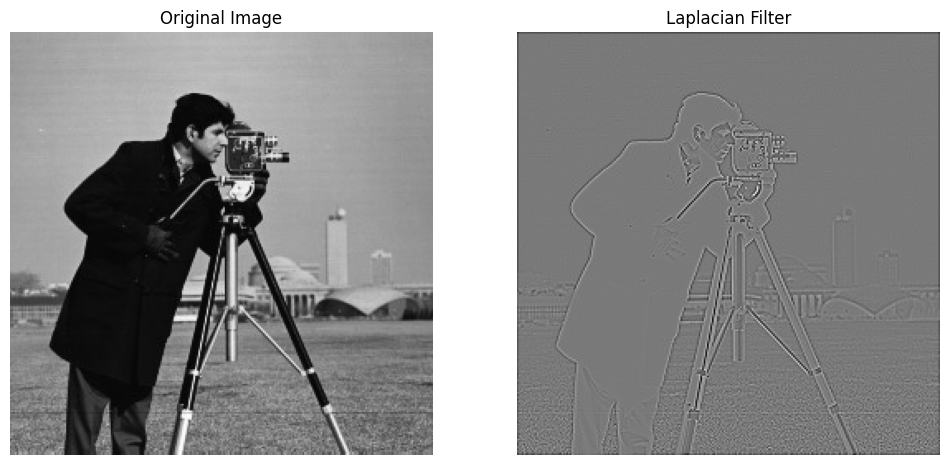

In [62]:
def manual_laplacian(img):
    kernel = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])
    return convolve2d(img, kernel, mode='same')

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')
ax[1].imshow(manual_laplacian(image), cmap='gray')
ax[1].axis('off')
ax[1].set_title('Laplacian Filter')
plt.show()

### Sharpening(extra)

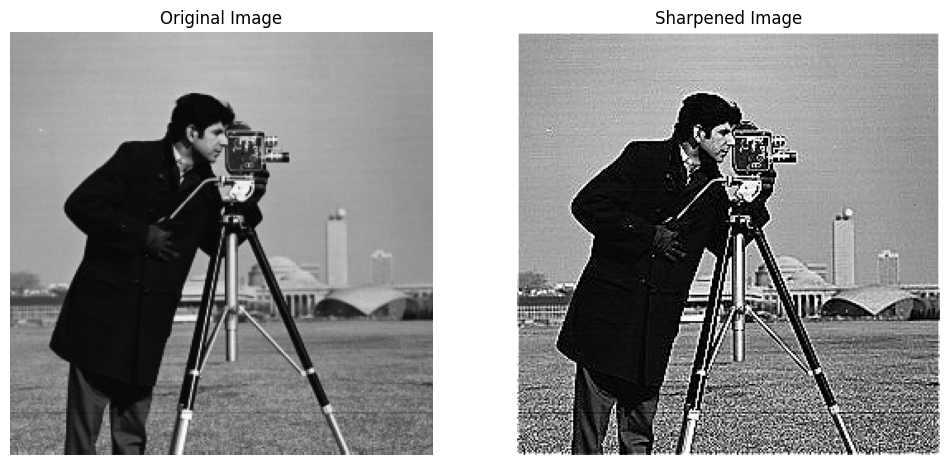

In [63]:
def manual_sharpen(img):
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
    return np.clip(convolve2d(img, kernel, mode='same'), 0, 1)

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')
ax[1].imshow(manual_sharpen(image), cmap='gray')
ax[1].axis('off')
ax[1].set_title('Sharpened Image')
plt.show()

### Mode Filter (extra)

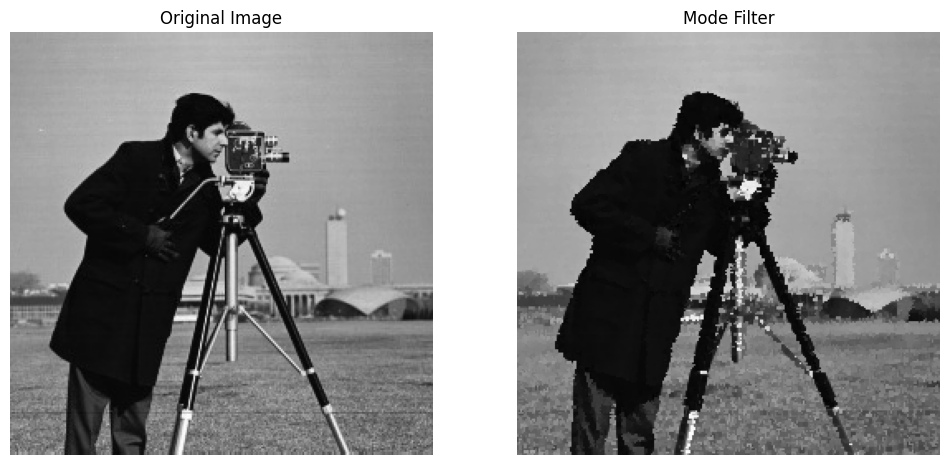

In [ ]:
img_mode = generic_filter(image, lambda v: stats.mode(v, keepdims=True)[0], size=3)

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')
ax[1].imshow(img_mode, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Mode Filter')
plt.show()

### Range Filter(extra)

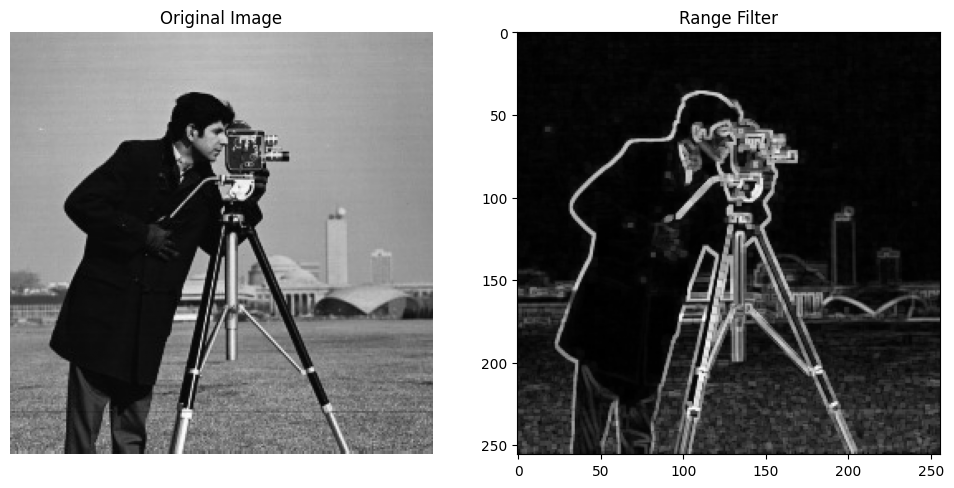

In [65]:
img_range = generic_filter(image, lambda v: np.max(v) - np.min(v), size=3)

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')
ax[1].imshow(img_range, cmap='gray')
ax[0].axis('off')
ax[1].set_title('Range Filter')
plt.show()

### Contrast Stretching(extra)

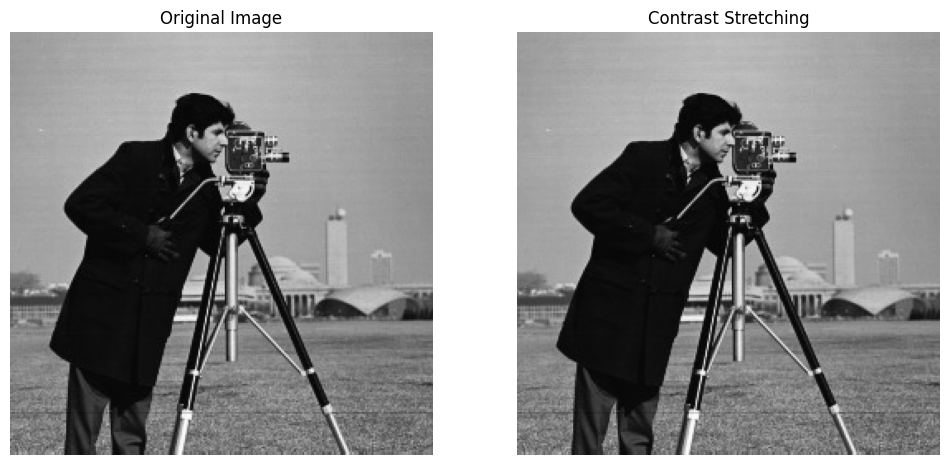

In [66]:
def manual_stretch(img):
    m, M = np.min(img), np.max(img)
    return (img - m) / (M - m)

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')
ax[1].imshow(manual_stretch(image), cmap='gray')
ax[1].axis('off')
ax[1].set_title('Contrast Stretching')
plt.show()

### Histogram Equalization(extra)

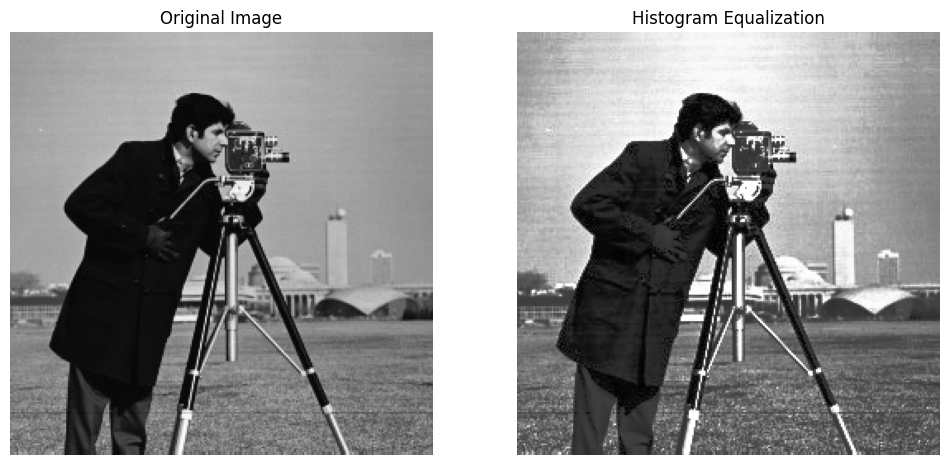

In [67]:
def manual_equalize(img):
    hist, bins = np.histogram(img.flatten(), 256, [0, 1])
    cdf = hist.cumsum()
    cdf_norm = cdf * (1.0 / cdf[-1])
    return np.interp(img.flatten(), bins[:-1], cdf_norm).reshape(img.shape)

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')
ax[1].imshow(manual_equalize(image), cmap='gray')
ax[1].axis('off')
ax[1].set_title('Histogram Equalization')
plt.show()

### Color Image Histogram(extra)

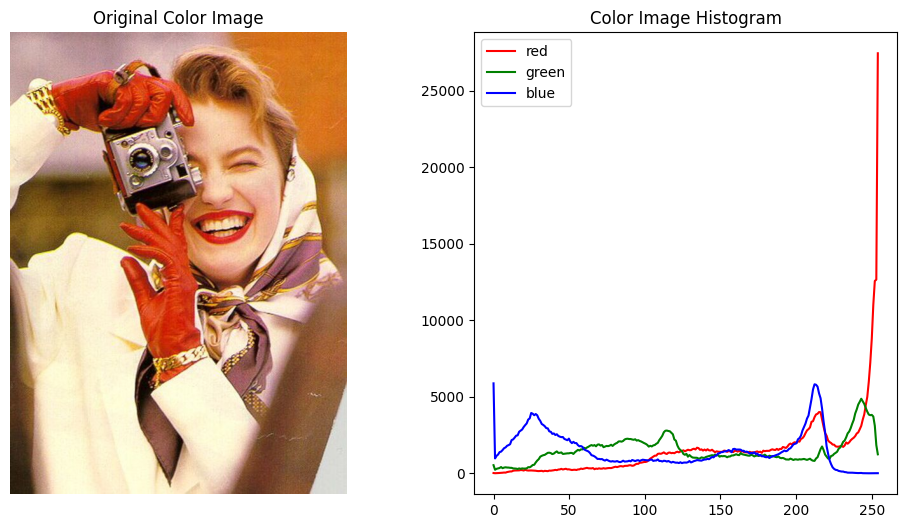

In [72]:
image_color = io.imread(r'C:\Users\Marven\Desktop\image processing project\a picture with a smile.jpeg')
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(image_color)
ax[0].axis('off')
ax[0].set_title('Original Color Image')

for i, col in enumerate(['red', 'green', 'blue']):
    hist, bins = np.histogram(image_color[:, :, i], bins=256, range=(0, 255))
    ax[1].plot(bins[:-1], hist, color=col, label=col)
ax[1].set_title('Color Image Histogram')
ax[1].legend()
plt.show()

### Thresholding Segmentation(extra)

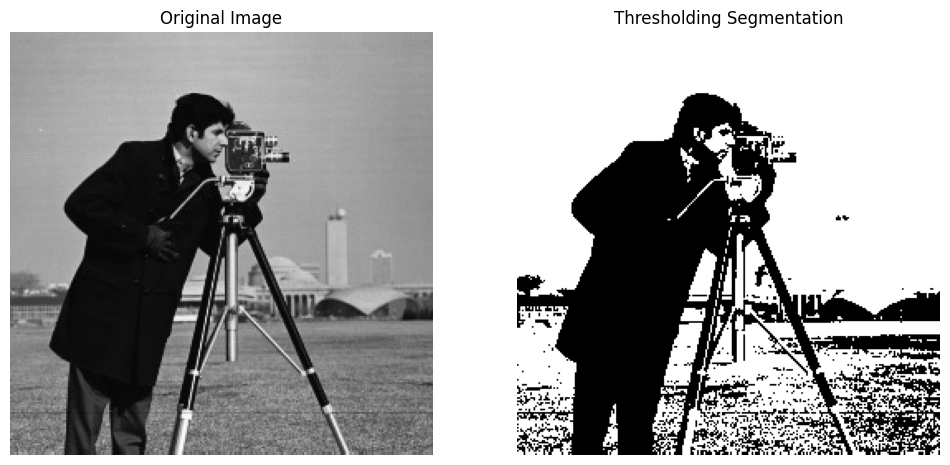

In [73]:
def manual_threshold(img):
    t = np.mean(img)
    return (img > t).astype(float)

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')
ax[1].imshow(manual_threshold(image), cmap='gray')
ax[1].axis('off')
ax[1].set_title('Thresholding Segmentation')
plt.show()

### Edge-Based Segmentation(extra)

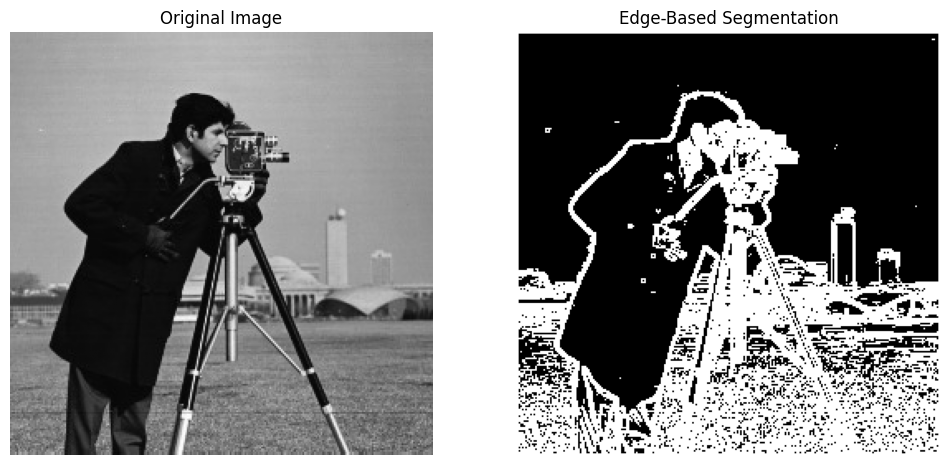

In [75]:
edges = manual_sobel(image)
seg_edge = (edges > 0.15).astype(float)

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')
ax[1].imshow(seg_edge, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Edge-Based Segmentation')
plt.show()

### Region-Based Segmentation (SLIC)(extra)

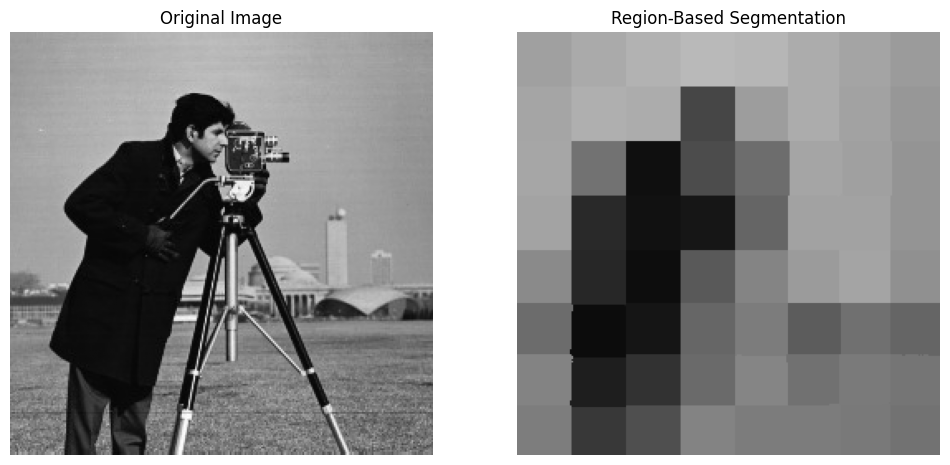

In [ ]:
labels = segmentation.slic(image, n_segments=60, compactness=10, start_label=1, channel_axis=None)
seg_region = color.label2rgb(labels, image, kind='avg')

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')
ax[1].imshow(seg_region)
ax[1].axis('off')
ax[1].set_title('Region-Based Segmentation')
plt.show()

### Clustering Segmentation (K-Means)(extra)

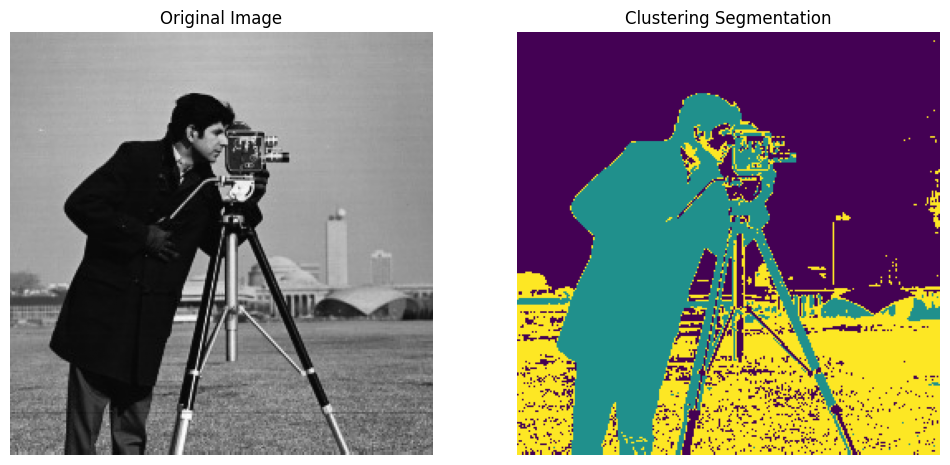

In [ ]:
kmeans = KMeans(n_clusters=3, n_init=10).fit(image.reshape(-1, 1))
seg_cluster = kmeans.labels_.reshape(image.shape)

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')
ax[1].imshow(seg_cluster, cmap='viridis')
ax[1].axis('off')
ax[1].set_title('Clustering Segmentation')
plt.show()

### Deep Learning-Based Segmentation Concept(extra)

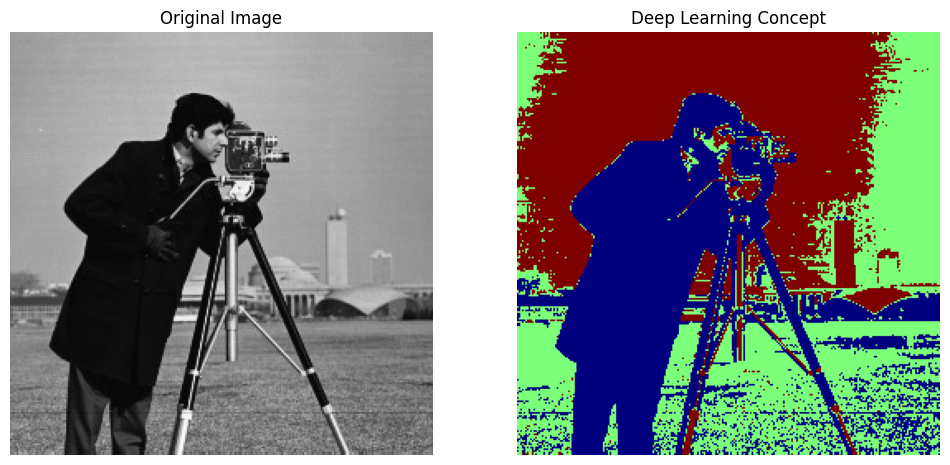

In [78]:
t1, t2 = np.percentile(image, [33, 66])
regions = np.digitize(image, bins=[t1, t2])

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(image, cmap='gray')
ax[0].axis('off')
ax[0].set_title('Original Image')
ax[1].imshow(regions, cmap='jet')
ax[1].axis('off')
ax[1].set_title('Deep Learning Concept')
plt.show()